In [1]:
import pandas as pd
import numpy as np
import json
import matplotlib
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from datetime import datetime
import warnings
warnings.filterwarnings('ignore')

plt.style.use("fivethirtyeight")

pd.options.display.max_columns = None #make all columns visible when printing the dataframe

- I will only use "train.csv" data for this notebook and split it into train and test sets for model validation, since "test.csv" data from Kaggle does not have target variables.

# 1) Data Reading
- Read dataset and print dataset information

In [2]:
delivery_data = pd.read_csv("train.csv", encoding="utf-8")
delivery_data.head()

,ID,Delivery_person_ID,Delivery_person_Age,Delivery_person_Ratings,Restaurant_latitude,Restaurant_longitude,Delivery_location_latitude,Delivery_location_longitude,Order_Date,Time_Orderd,Time_Order_picked,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,Time_taken(min)
0,0x4607,INDORES13DEL02,37,4.9,22.745049,75.892471,22.765049,75.912471,19-03-2022,11:30:00,11:45:00,conditions Sunny,High,2,Snack,motorcycle,0,No,Urban,(min) 24
1,0xb379,BANGRES18DEL02,34,4.5,12.913041,77.683237,13.043041,77.813237,25-03-2022,19:45:00,19:50:00,conditions Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,(min) 33
2,0x5d6d,BANGRES19DEL01,23,4.4,12.914264,77.678400,12.924264,77.688400,19-03-2022,08:30:00,08:45:00,conditions Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,(min) 26
3,0x7a6a,COIMBRES13DEL02,38,4.7,11.003669,76.976494,11.053669,77.026494,05-04-2022,18:00:00,18:10:00,conditions Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,(min) 21
4,0x70a2,CHENRES12DEL01,32,4.6,12.972793,80.249982,13.012793,80.289982,26-03-2022,13:30:00,13:45:00,conditions Cloudy,High,1,Snack,scooter,1,No,Metropolitian,(min) 30


In [3]:
delivery_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 20 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   ID                           45593 non-null  object 
 1   Delivery_person_ID           45593 non-null  object 
 2   Delivery_person_Age          45593 non-null  object 
 3   Delivery_person_Ratings      45593 non-null  object 
 4   Restaurant_latitude          45593 non-null  float64
 5   Restaurant_longitude         45593 non-null  float64
 6   Delivery_location_latitude   45593 non-null  float64
 7   Delivery_location_longitude  45593 non-null  float64
 8   Order_Date                   45593 non-null  object 
 9   Time_Orderd                  45593 non-null  object 
 10  Time_Order_picked            45593 non-null  object 
 11  Weatherconditions            45593 non-null  object 
 12  Road_traffic_density         45593 non-null  object 
 13  Vehicle_conditio

# 2) Data Cleaning
- Clean target and feature variables from unnecesarry information 
- Handle NaN values

In [4]:
'''
Remove "min" string from target variable and get numerical target
'''

delivery_data["Time_taken(min)"] = delivery_data["Time_taken(min)"].apply(lambda x: x[len("(min) "):]).astype(int)
delivery_data.rename(columns={"Time_taken(min)" : "delivery_time_taken"},inplace=True)

In [5]:
delivery_data["Weatherconditions"].unique()

array(['conditions Sunny', 'conditions Stormy', 'conditions Sandstorms',
       'conditions Cloudy', 'conditions Fog', 'conditions Windy',
       'conditions NaN'], dtype=object)

- Weather conditions feature contians string "NaN" values that we should convert to Null values

In [6]:
'''
Remove "conditions" string from weather conditions feature and convert string "NaN" values to np.nan
'''

delivery_data["Weatherconditions"] = delivery_data["Weatherconditions"].apply(lambda x: x[len("conditions "):])
delivery_data["Weatherconditions"].replace("NaN", np.nan, inplace=True)


In [7]:
delivery_data.isna().sum()

ID                               0
Delivery_person_ID               0
Delivery_person_Age              0
Delivery_person_Ratings          0
Restaurant_latitude              0
Restaurant_longitude             0
Delivery_location_latitude       0
Delivery_location_longitude      0
Order_Date                       0
Time_Orderd                      0
Time_Order_picked                0
Weatherconditions              616
Road_traffic_density             0
Vehicle_condition                0
Type_of_order                    0
Type_of_vehicle                  0
multiple_deliveries              0
Festival                         0
City                             0
delivery_time_taken              0
dtype: int64

- Other features do not contain object Null values so we should investiage if they have string "NaN" values or not

In [8]:
print(delivery_data["Road_traffic_density"].unique())

['High ' 'Jam ' 'Low ' 'Medium ' 'NaN ']


In [9]:
'''
It seems "NaN" strings have a space after them, convert both "NaN " and "NaN" to object Null values
'''

delivery_data.replace("NaN ", np.nan, inplace=True)
delivery_data.replace("NaN", np.nan, inplace=True)

delivery_data.isna().sum()

ID                                0
Delivery_person_ID                0
Delivery_person_Age            1854
Delivery_person_Ratings        1908
Restaurant_latitude               0
Restaurant_longitude              0
Delivery_location_latitude        0
Delivery_location_longitude       0
Order_Date                        0
Time_Orderd                    1731
Time_Order_picked                 0
Weatherconditions               616
Road_traffic_density            601
Vehicle_condition                 0
Type_of_order                     0
Type_of_vehicle                   0
multiple_deliveries             993
Festival                        228
City                           1200
delivery_time_taken               0
dtype: int64

- We should handle Null values. I will use imputation beacuse not want to lose any information

    > Mean imputation for numerical variables and mode imputation for categorical variables seems proper for this dataset
    >> "Time_Orderd" NaN's will replace with rows "Time_Order_picked" since it is a date variable

In [10]:
from sklearn.impute import SimpleImputer

mean_cols = ["Delivery_person_Age", "Delivery_person_Ratings"]

mode_cols = ["Weatherconditions", "Road_traffic_density", 
             "multiple_deliveries", "Festival", "City"]

mean_imp = SimpleImputer(missing_values=np.nan, strategy='mean')

for col in mean_cols:
    delivery_data[col] = mean_imp.fit_transform(delivery_data[col].to_numpy().reshape(-1,1))

mode_imp = SimpleImputer(missing_values=np.nan, strategy='most_frequent')

for col in mode_cols:
    delivery_data[col] = mode_imp.fit_transform(delivery_data[col].to_numpy().reshape(-1,1))

delivery_data["Time_Orderd"] = delivery_data["Time_Orderd"].fillna(delivery_data["Time_Order_picked"])

In [11]:
delivery_data.isna().sum()

ID                             0
Delivery_person_ID             0
Delivery_person_Age            0
Delivery_person_Ratings        0
Restaurant_latitude            0
Restaurant_longitude           0
Delivery_location_latitude     0
Delivery_location_longitude    0
Order_Date                     0
Time_Orderd                    0
Time_Order_picked              0
Weatherconditions              0
Road_traffic_density           0
Vehicle_condition              0
Type_of_order                  0
Type_of_vehicle                0
multiple_deliveries            0
Festival                       0
City                           0
delivery_time_taken            0
dtype: int64

# 3) Feature Generation & Explarotary Data Analysis
- Extract new features from existing features to enrich the dataset
- Visualize how delivery time changes w.r.t features
- Examine the relationships of features over delivery time

### a) Generate New Features

In [12]:
import geopy.distance

coord_features = [
        "Restaurant_latitude", 
        "Restaurant_longitude", 
        "Delivery_location_latitude", 
        "Delivery_location_longitude"
        ]

def calculate_dist(la1,lo1,la2,lo2):

        '''
        Calculate distance between restaurants and delivery points by using coordinates
        '''

        return geopy.distance.geodesic((abs(la1),abs(lo1)), (abs(la2),abs(lo2))).km

delivery_data["distance"] = delivery_data[coord_features].apply(lambda x: calculate_dist(*x), axis=1)

delivery_data.drop(coord_features, axis=1, inplace=True)

In [13]:
def prep_time(df):
    
    '''
    Convert order time and order_picked times to datetime objects and extract time information and calculate preperation time
    '''

    df["order_datetime"] = pd.to_datetime(df["Order_Date"] + ' ' + df["Time_Orderd"], dayfirst=True)
    df["picked_datetime"] = pd.to_datetime(df["Order_Date"] + ' ' + df["Time_Order_picked"], dayfirst=True)

    df = df.drop(["Order_Date", "Time_Orderd", "Time_Order_picked"], axis=1)

    df["ordered_hour"] = df["order_datetime"].apply(lambda x: x.hour)
    df["ordered_min"] = df["order_datetime"].apply(lambda x: x.minute)

    df["picked_hour"] = df["picked_datetime"].apply(lambda x: x.hour)
    df["picked_min"] = df["picked_datetime"].apply(lambda x: x.minute)

    def calc_prep_time(ord_hour, ord_min, pc_hour, pc_min):
        
        '''
        Calculating order preperation times. Careful about:
            - orders given before hour 24 and picked after hour 24
            - order preperation times bigger than 60 minutes
        '''
        
        if ord_hour == pc_hour:
            if pc_min > ord_min:
                return pc_min - ord_min
            else:
                return 0

        else:
            return 60 - ord_min + pc_min

    df["prep_min"] = df.iloc[:,-4:].apply(lambda x: calc_prep_time(*x), axis=1)
    
    return df

delivery_data = prep_time(delivery_data)

In [14]:
def create_date_intervals(df):
    
    '''
    Create date intervals as; is weekend or not, periods of month and quarters of year
    '''

    df["is_weekend"] = delivery_data["order_datetime"].dt.day_of_week > 4

    df["month_intervals"] = df["order_datetime"].apply(lambda x: "start_month" if x.day <=10 
                                                   else ("middle_month" if x.day <= 20 else "end_month"))

    df["year_quarter"] = df["order_datetime"].apply(lambda x: x.quarter)

    return df

delivery_data = create_date_intervals(delivery_data)

### b) Visualize Data

In [15]:
variables_df = delivery_data.copy()

variables_df = variables_df.drop(["ID", "Delivery_person_ID", "order_datetime", 
                            "picked_datetime", "picked_hour", "picked_min"], axis=1)

variables_df.head()

,Delivery_person_Age,Delivery_person_Ratings,Weatherconditions,Road_traffic_density,Vehicle_condition,Type_of_order,Type_of_vehicle,multiple_deliveries,Festival,City,delivery_time_taken,distance,ordered_hour,ordered_min,prep_min,is_weekend,month_intervals,year_quarter
0,37.0,4.9,Sunny,High,2,Snack,motorcycle,0,No,Urban,24,3.020737,11,30,15,True,middle_month,1
1,34.0,4.5,Stormy,Jam,2,Snack,scooter,1,No,Metropolitian,33,20.143737,19,45,5,False,end_month,1
2,23.0,4.4,Sandstorms,Low,0,Drinks,motorcycle,1,No,Urban,26,1.549693,8,30,15,True,middle_month,1
3,38.0,4.7,Sunny,Medium,0,Buffet,motorcycle,1,No,Metropolitian,21,7.774497,18,0,10,False,start_month,2
4,32.0,4.6,Cloudy,High,1,Snack,scooter,1,No,Metropolitian,30,6.197898,13,30,15,True,end_month,1


In [16]:
variables_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45593 entries, 0 to 45592
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Delivery_person_Age      45593 non-null  float64
 1   Delivery_person_Ratings  45593 non-null  float64
 2   Weatherconditions        45593 non-null  object 
 3   Road_traffic_density     45593 non-null  object 
 4   Vehicle_condition        45593 non-null  int64  
 5   Type_of_order            45593 non-null  object 
 6   Type_of_vehicle          45593 non-null  object 
 7   multiple_deliveries      45593 non-null  object 
 8   Festival                 45593 non-null  object 
 9   City                     45593 non-null  object 
 10  delivery_time_taken      45593 non-null  int64  
 11  distance                 45593 non-null  float64
 12  ordered_hour             45593 non-null  int64  
 13  ordered_min              45593 non-null  int64  
 14  prep_min              

In [17]:
variables_df.describe()

,Delivery_person_Age,Delivery_person_Ratings,Vehicle_condition,delivery_time_taken,distance,ordered_hour,ordered_min,prep_min,year_quarter
count,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000,45593.000000
mean,29.567137,4.633780,1.023359,26.294607,9.718922,17.407102,29.499704,9.610138,1.139539
std,5.695692,0.327638,0.839065,9.383806,5.599119,4.846890,16.652575,4.440525,0.346512
min,15.000000,1.000000,0.000000,10.000000,1.463837,0.000000,0.000000,0.000000,1.000000
25%,25.000000,4.600000,0.000000,19.000000,4.654040,15.000000,15.000000,5.000000,1.000000
50%,29.567137,4.700000,1.000000,26.000000,9.203840,19.000000,30.000000,10.000000,1.000000
75%,34.000000,4.800000,2.000000,32.000000,13.660197,21.000000,45.000000,15.000000,1.000000
max,50.000000,6.000000,3.000000,54.000000,20.942906,23.000000,55.000000,15.000000,2.000000


### Bivariate Analysis

In [18]:
target = "delivery_time_taken"
numerical_features = ["Delivery_person_Age", "Delivery_person_Ratings", "distance",
                      "ordered_hour", "ordered_min", "prep_min"]

categorical_features = list(variables_df.drop(columns=numerical_features + [target], axis=1).columns)

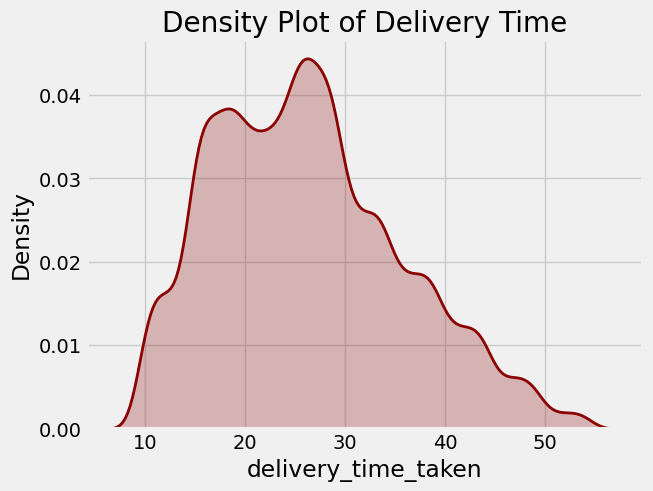

In [19]:
sns.kdeplot(data=variables_df, x=target, shade=True, color="darkred", lw=2)
plt.title("Density Plot of Delivery Time")
plt.show()

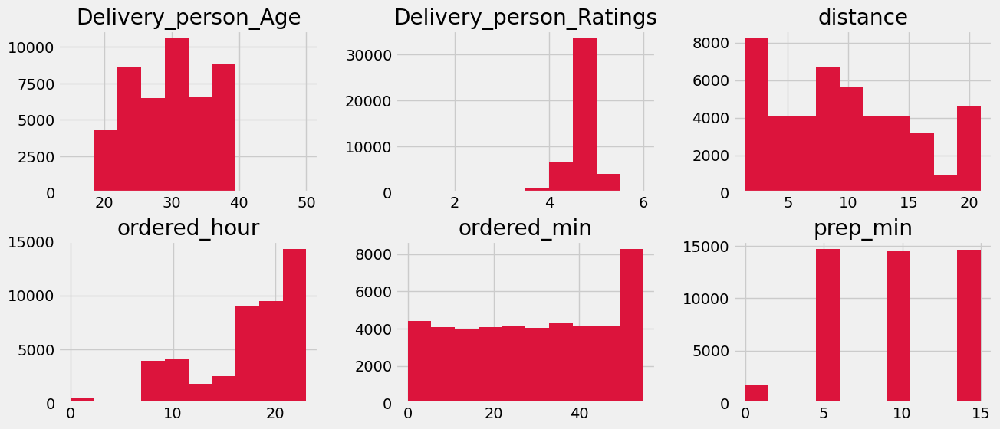

In [20]:
variables_df[numerical_features].hist(layout=(2,3), figsize=(14,6), color="crimson")
plt.show()

The distributions of numerical features seems to needed a normalization so I will use MinMax (0-1) scaling

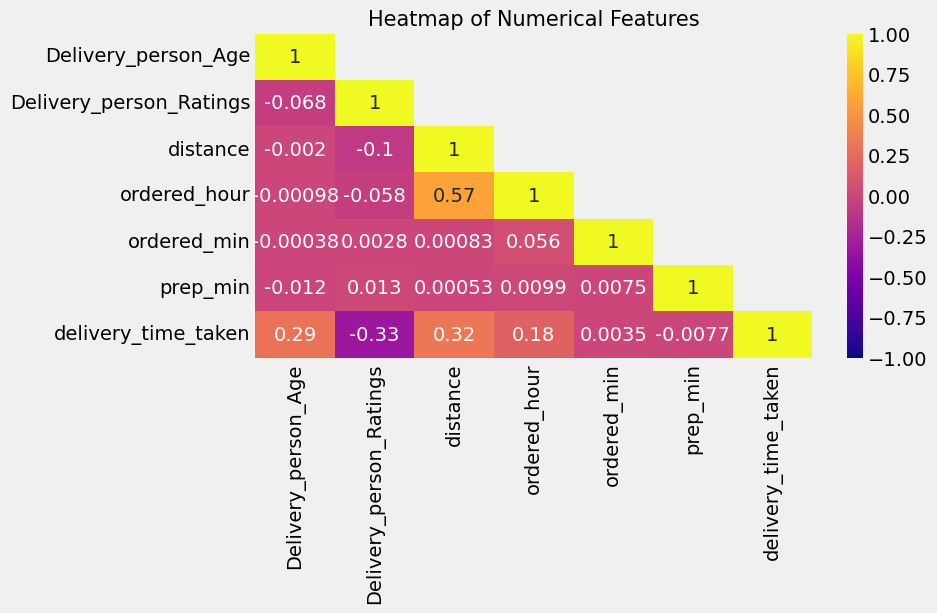

In [21]:
plt.figure(figsize=(8,4))

corr = variables_df[numerical_features+[target]].corr()
mask = np.triu(np.ones_like(corr, dtype=bool))

np.fill_diagonal(mask, False)

sns.heatmap(corr, annot=True, mask=mask, 
    vmin=-1, vmax=1, cmap='plasma'
    )

plt.title("Heatmap of Numerical Features", fontsize=15)
plt.show()

In [22]:
len(categorical_features)

11

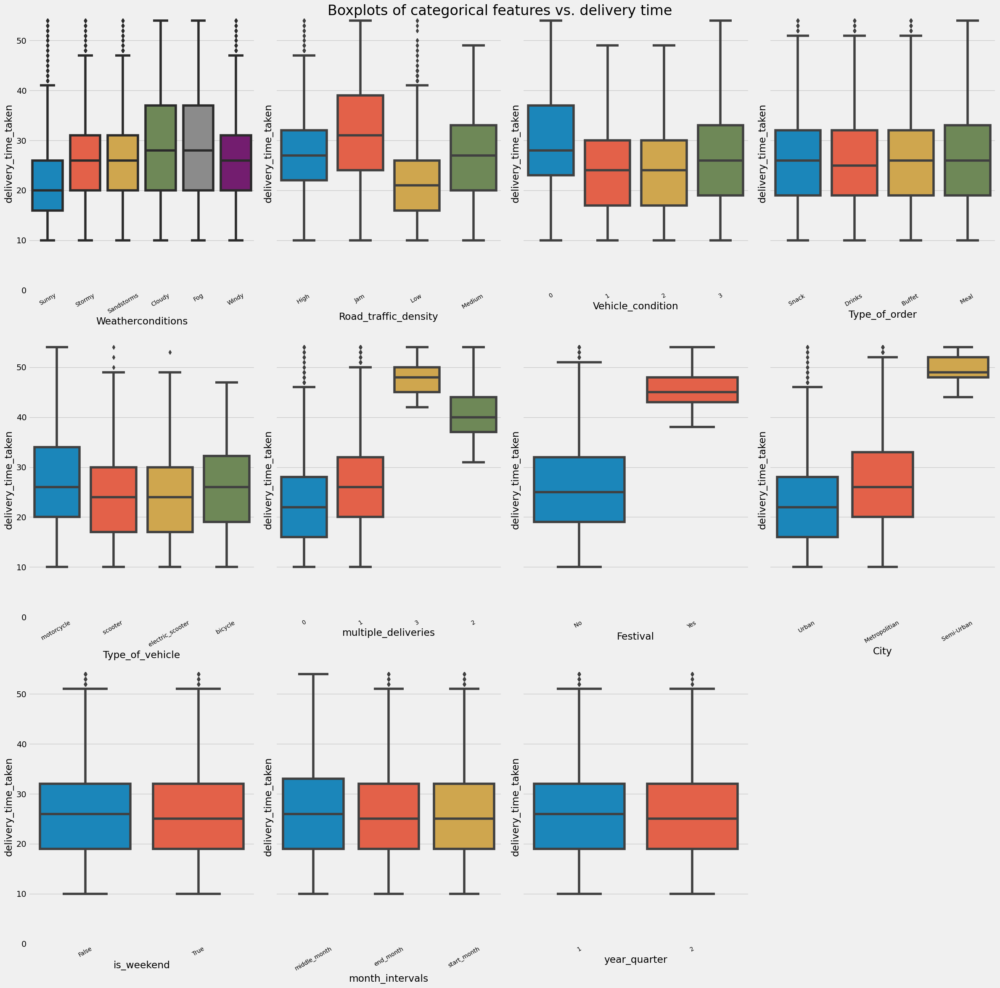

In [23]:
fig, ax = plt.subplots(3,4, figsize=(24,24), sharey=True)
fig.set_tight_layout(True)

row,col = 0,0

for var in categorical_features:
    sns.boxplot(data=variables_df, x=var, y=target, ax=ax[row,col])
    ax[row,col].set_ylim([0,55])
    xlabels = ax[row,col].get_xticklabels()
    ax[row,col].set_xticklabels(xlabels, size=10, rotation=30)

    if col < 3:
        col += 1 
    else:
        row += 1
        col = 0

fig.delaxes(ax[2,3]) #delete empty plot
fig.suptitle("Boxplots of categorical features vs. delivery time", fontsize=24)
plt.show()

### Multivariate Analysis

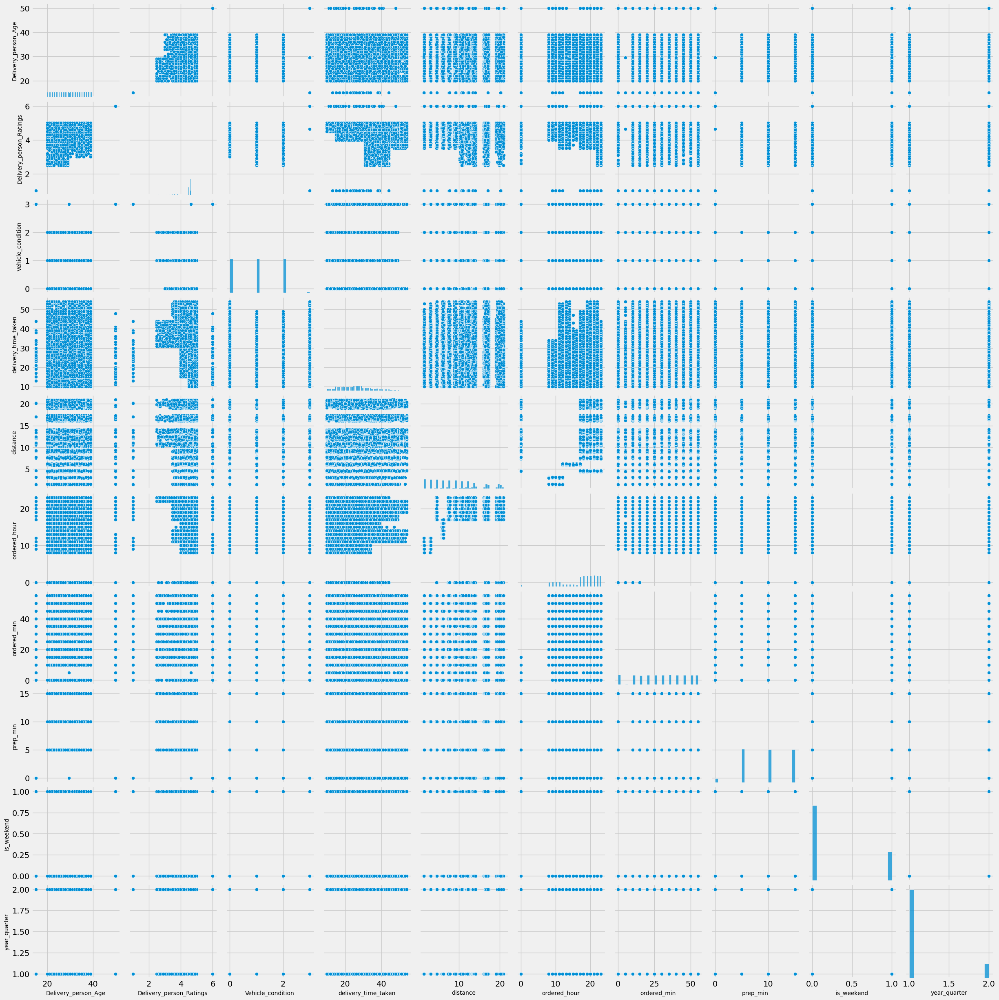

In [24]:
sns.set_context(rc={"axes.labelsize":10})
sns.pairplot(data=variables_df)
plt.show()

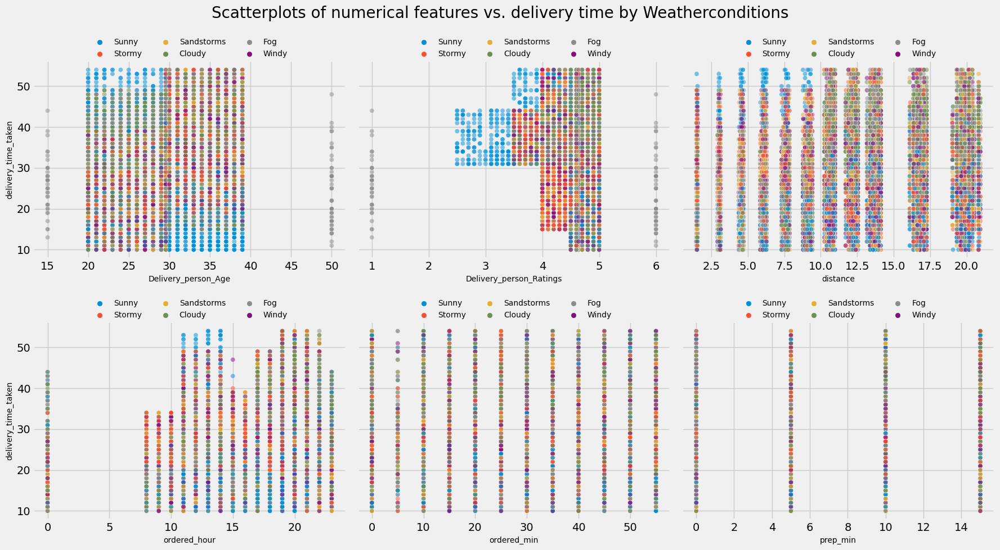

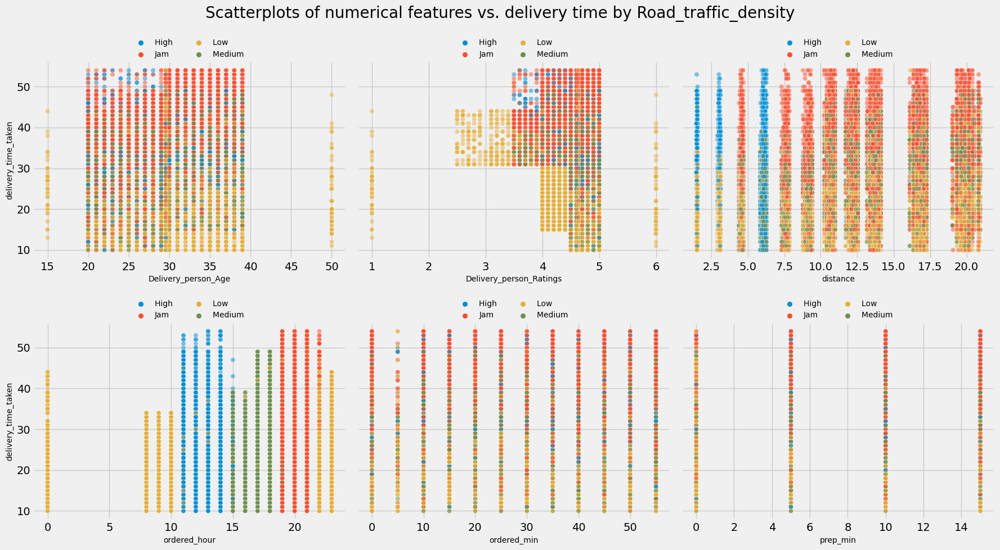

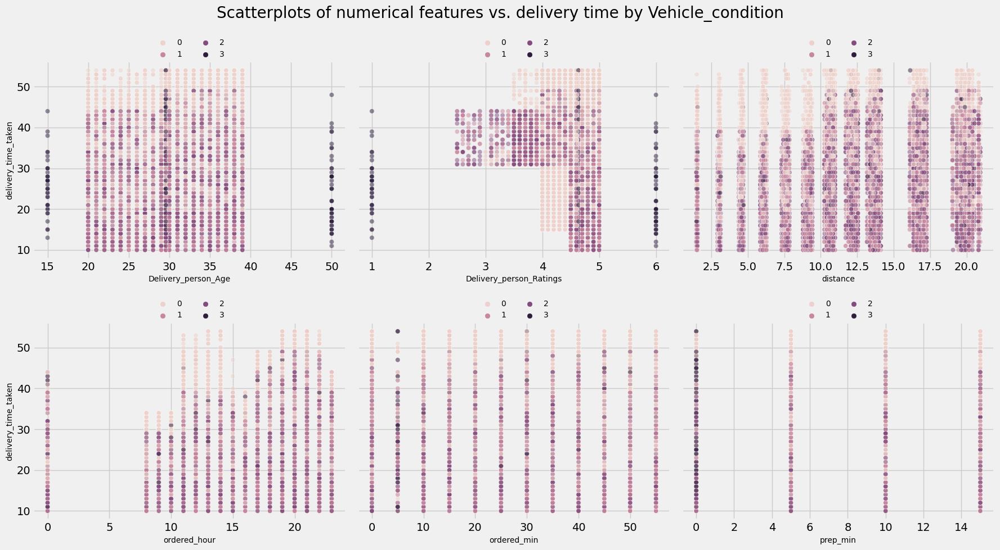

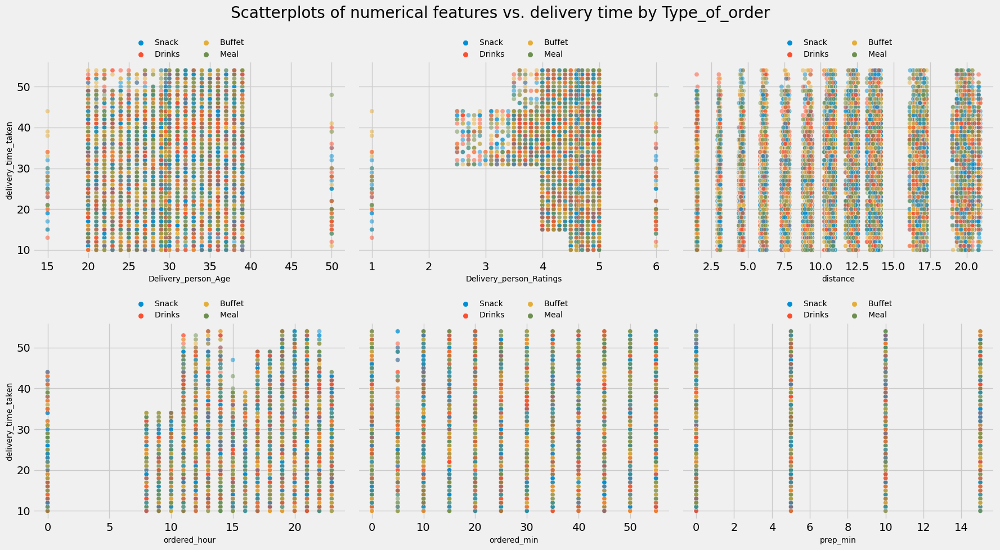

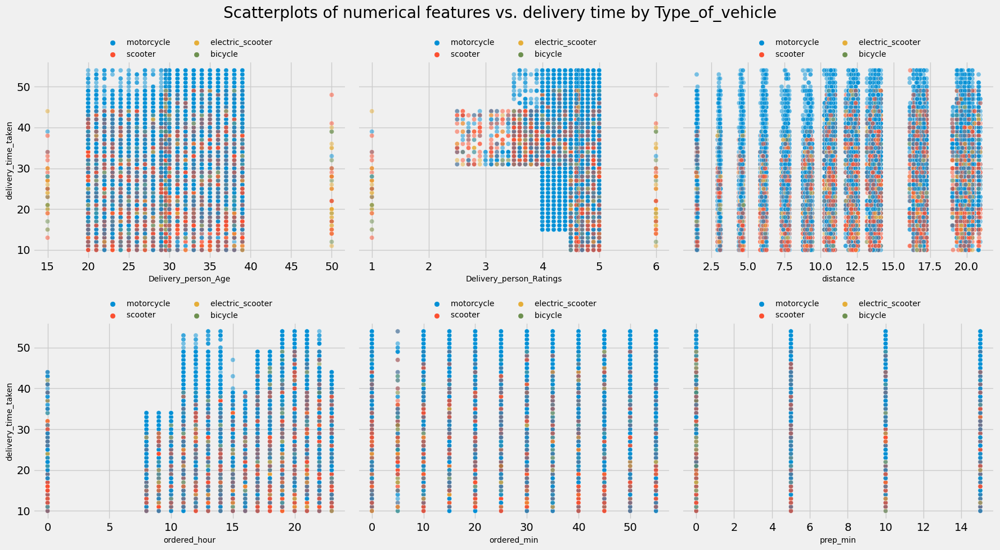

...

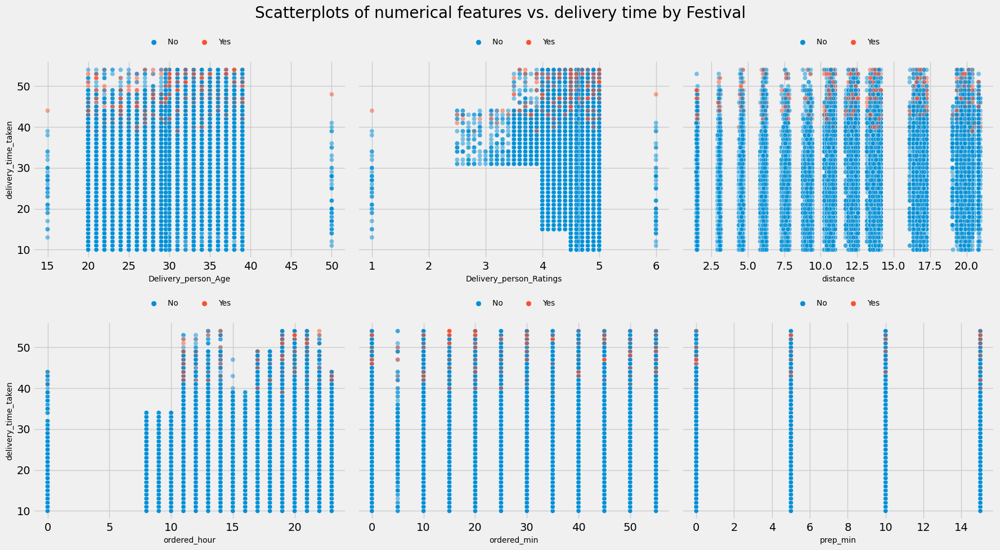

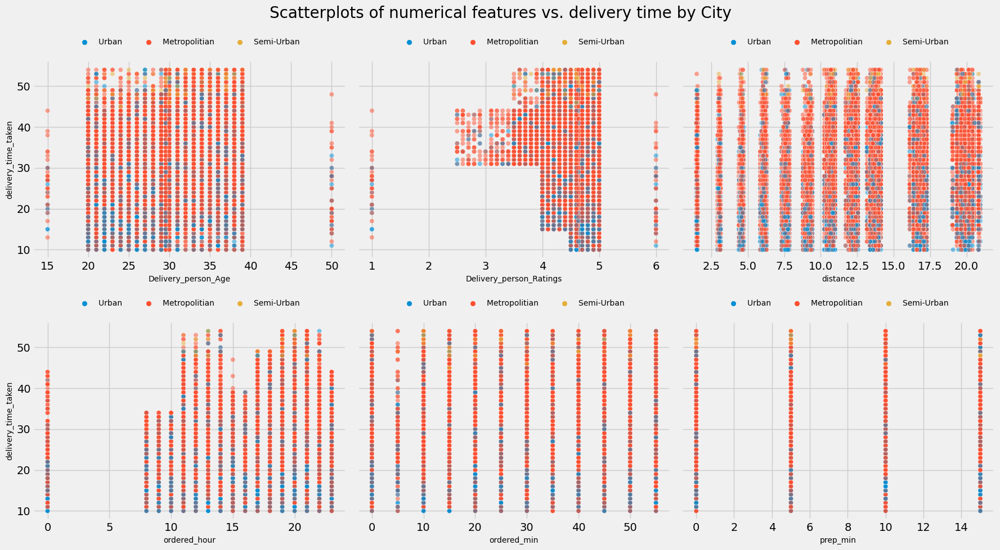

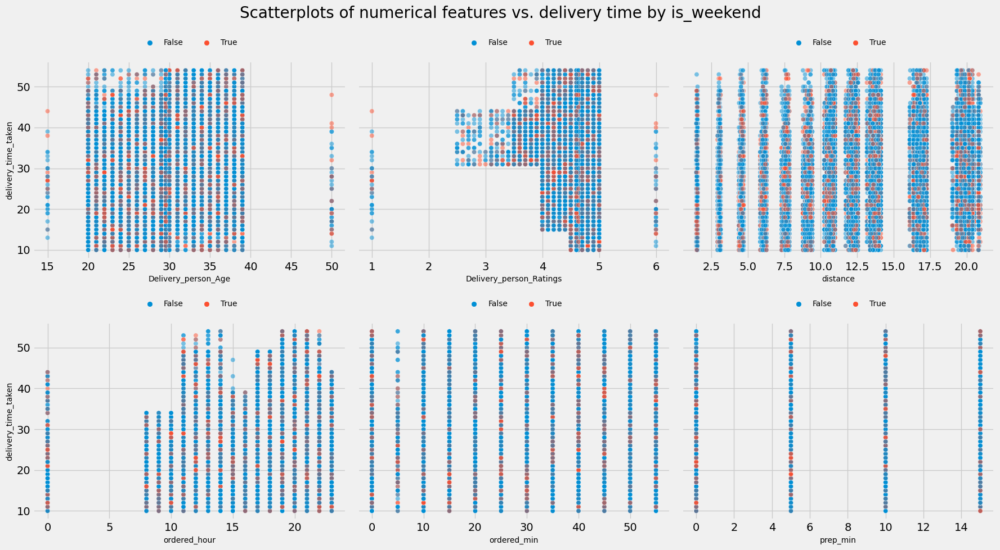

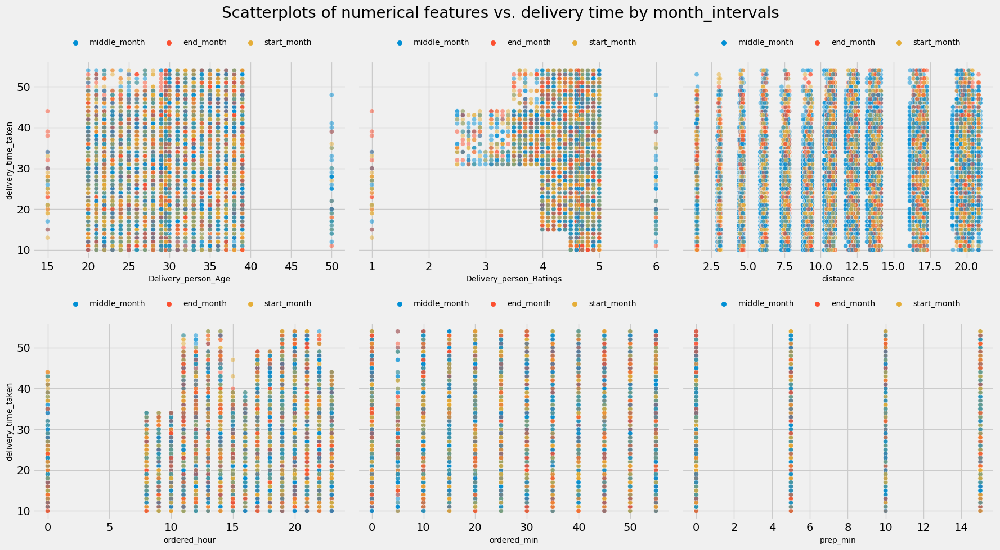

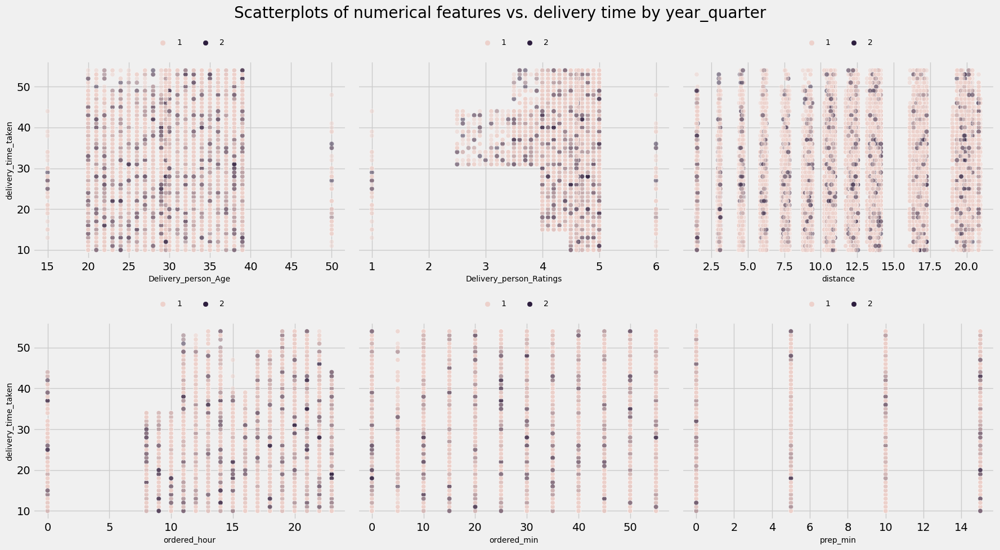

In [25]:
for category in categorical_features:
    fig, ax = plt.subplots(2,3, figsize=(18,10), sharey=True)
    fig.set_tight_layout(True)

    row,col = 0,0

    for var in numerical_features:
        sns.scatterplot(data=variables_df, x=var, y=target, hue=category, ax=ax[row,col], alpha=0.5)
        
        ax[row,col].legend(
            loc='upper center',frameon=False, bbox_to_anchor=(0.5, 1.15), fontsize=10,
            ncol=len(variables_df[category].unique()) if len(variables_df[category].unique()) < 4 else len(variables_df[category].unique())//2
            )
        
        if col < 2:
            col += 1 
        else:
            row += 1
            col = 0

    fig.suptitle(f'Scatterplots of numerical features vs. delivery time by {category}', fontsize=20)
    plt.show()

Analyze if delivery person's age or rating affect delivery time by distance

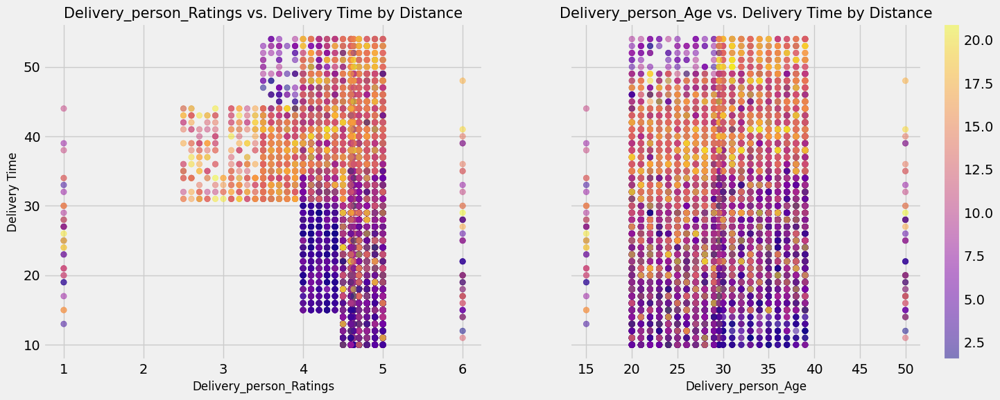

In [46]:
fig, ax = plt.subplots(1,2, figsize=(16,6), sharey=True)
cm = plt.cm.get_cmap('plasma')

for i,delivery in enumerate(["Delivery_person_Ratings", "Delivery_person_Age"]):
    plot = ax[i].scatter(x=variables_df[delivery], y=variables_df[target], c=variables_df["distance"], alpha=0.5, cmap=cm)
    ax[i].set_xlabel(delivery, fontsize=12)
    ax[i].set_title(delivery + " vs. Delivery Time by Distance", fontsize=15)

ax[0].set_ylabel("Delivery Time", fontsize=12)
fig.colorbar(plot)
plt.show()

# 4) Model Training
- Train regression based machine learning models and make predictions
- Make predictions and compare results
- Apply:
  - Standardization
  - Baseline estimation
  - Grid search cross-validaton for hyperparameter tuning
  - Hold-out method for test set
  - Examine feature importances

In [47]:
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
from sklearn.model_selection import train_test_split, GridSearchCV, cross_validate, KFold
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor, AdaBoostRegressor, StackingRegressor, VotingRegressor
from sklearn.svm import SVR
from sklearn.linear_model import Ridge
from xgboost import XGBRegressor

### Pre-Processing

Convert categorical feature values into numerical values using LabelEncoder

In [48]:
label_enc = LabelEncoder()

for category in categorical_features:
    variables_df[category] = label_enc.fit_transform(variables_df[category])

X = variables_df[numerical_features + categorical_features]
y = variables_df[target]

Split as train and test sets by size of %33 and apply 0-1 scaling to the dataset

In [49]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, shuffle=True)

scaler = MinMaxScaler()

X_train = pd.DataFrame(
    data = scaler.fit_transform(X_train),
    columns = X_train.columns
    )

X_test = pd.DataFrame(
    data = scaler.fit_transform(X_test),
    columns = X_test.columns
    )

### Baseline Result

In [50]:
#Baseline result with Ridge Regression

ridge = Ridge(alpha=1.0)

cv = KFold(n_splits=5)
baseline_scores = cross_validate(ridge, X_train, y_train, cv=cv, scoring=('r2', 'neg_mean_squared_error'))

print("RMSE score of Ridge Regression:", np.mean(np.sqrt(-baseline_scores["test_neg_mean_squared_error"])))
print("R^2 score of Ridge Regression:", np.mean(baseline_scores["test_r2"]))

RMSE score of Ridge Regression: 6.675366317989567
R^2 score of Ridge Regression: 0.49359487224461923


### Grid Search

Apply grid search to find best parameters and create baseline results for XGBoost, Random Forest, Ada Boost and Support Vector Regressor algorithms

In [60]:
#XGBoost
params = {
        'max_depth': [3, 6, 10],
        'colsample_bytree': [0.5, 0.75],
        'subsample': [0.5, 0.75],
        'min_split_loss': [0, 0.5, 0.75],
        'reg_alpha': [0, 0.5, 0.75],
        'reg_lambda': [0, 0.5, 0.75]
        }

xgb = XGBRegressor(
        learning_rate=0.5,
        n_estimators=200,
        objective='reg:squarederror', 
        eval_metric='rmse', 
        tree_method="auto", 
        n_jobs=-1
        )

grid = GridSearchCV(estimator=xgb, 
                   param_grid=params,
                   scoring='neg_root_mean_squared_error',
                   cv=3
                   )

grid.fit(X_train, y_train)
print("Best parameters:", grid.best_params_)
print("Lowest RMSE: ", grid.best_score_)

cv_results = grid.cv_results_
cv_results = pd.concat([pd.DataFrame(cv_results["params"]),
                        pd.DataFrame(cv_results["mean_test_score"], columns=["test_mean_rmse"])],
                       axis=1)

cv_results.sort_values(by="test_mean_rmse", ascending=False)[:5]

Best parameters: {'colsample_bytree': 0.75, 'max_depth': 3, 'min_split_loss': 0, 'reg_alpha': 0.75, 'reg_lambda': 0.5, 'subsample': 0.75}
Lowest RMSE:  -4.379601469466098


,colsample_bytree,max_depth,min_split_loss,reg_alpha,reg_lambda,subsample,test_mean_rmse
177,0.75,3,0.00,0.75,0.50,0.75,-4.379601
185,0.75,3,0.50,0.00,0.75,0.75,-4.382531
203,0.75,3,0.75,0.00,0.75,0.75,-4.382531
167,0.75,3,0.00,0.00,0.75,0.75,-4.385907
191,0.75,3,0.50,0.50,0.75,0.75,-4.387935


Choose number of estimators of XGBoost model by using early stopping method to control overfitting

In [63]:
#Select a low learning rate to avoid overfitting

xgb = XGBRegressor(
    max_depth=3,
    colsample_bytree=0.75,
    subsample=0.75,
    min_split_loss=0,
    reg_lambda=0.5,
    reg_alpha=0.75,
    learning_rate=0.01,
    n_estimators=5000,
    objective='reg:squarederror', 
    eval_metric='rmse', 
    tree_method="auto", 
    verbosity=1,
    early_stopping_rounds=30,
    n_jobs=-1
)

cv = KFold(n_splits=5)
for i, (train_index, val_index) in enumerate(cv.split(X_train)):

    xgb.fit(
        X_train.iloc[train_index], y_train.iloc[train_index],
        eval_set = [(X_train.iloc[val_index], y_train.iloc[val_index])],
        verbose=1000
        )

    y_pred = xgb.predict(X_train.iloc[val_index])
    rmse = np.sqrt(mean_squared_error(y_train.iloc[val_index], y_pred))
    r2 = r2_score(y_train.iloc[val_index], y_pred)

    print(f"\nRMSE of Fold {i+1}:", f'{rmse: .2f}')
    print(f"R^2 Score of Fold {i+1}:", f'{r2: .2f}\n')

[0]	validation_0-rmse:27.09164
[1000]	validation_0-rmse:4.50492
[2000]	validation_0-rmse:4.39509
[2837]	validation_0-rmse:4.35270

RMSE of Fold 1:  4.35
R^2 Score of Fold 1:  0.79

[0]	validation_0-rmse:27.15527
[1000]	validation_0-rmse:4.45016
[2000]	validation_0-rmse:4.33354
[3000]	validation_0-rmse:4.28739
[3564]	validation_0-rmse:4.27461

RMSE of Fold 2:  4.27
R^2 Score of Fold 2:  0.79

[0]	validation_0-rmse:27.32699
[1000]	validation_0-rmse:4.46683
[2000]	validation_0-rmse:4.35574
[3000]	validation_0-rmse:4.31749
[4000]	validation_0-rmse:4.29954
[4444]	validation_0-rmse:4.29403

RMSE of Fold 3:  4.29
R^2 Score of Fold 3:  0.79

[0]	validation_0-rmse:26.99749
[1000]	validation_0-rmse:4.45745
[2000]	validation_0-rmse:4.34559
[3000]	validation_0-rmse:4.30678
[4000]	validation_0-rmse:4.28205
[4522]	validation_0-rmse:4.27247

RMSE of Fold 4:  4.27
R^2 Score of Fold 4:  0.79

[0]	validation_0-rmse:27.14510
[1000]	validation_0-rmse:4.47142
[2000]	validation_0-rmse:4.36331
[3000]	validat

Using early stopping method, we can observe that root mean sqaured error metric stopped to improve average around estimator number 3800. We can set n_estimators parameter as 3800 with tuned parameters

In [55]:
#Random Forest
params = { 
        'max_depth': [3, 6, 10, 50],
        'n_estimators': [100, 250, 500, 1000],
        'min_samples_split' : [2, 5, 8],
        'min_samples_leaf' : [1, 3, 5]
        }

rnd = RandomForestRegressor(max_features=None)
grid = GridSearchCV(estimator=rnd, 
                   param_grid=params,
                   scoring='neg_root_mean_squared_error',
                   cv=3
                   )

grid.fit(X_train, y_train)
print("Best parameters:", grid.best_params_)
print("Lowest RMSE: ", grid.best_score_)

cv_results = grid.cv_results_
cv_results = pd.concat([pd.DataFrame(cv_results["params"]),
                        pd.DataFrame(cv_results["mean_test_score"], columns=["test_mean_rmse"])],
                       axis=1)

cv_results.sort_values(by="test_mean_rmse", ascending=False)[:5]

Best parameters: {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 8, 'n_estimators': 1000}
Lowest RMSE:  -3.9184339958364007


,max_depth,min_samples_leaf,min_samples_split,n_estimators,test_mean_rmse
83,10,1,8,1000,-3.918434
75,10,1,2,1000,-3.918631
74,10,1,2,500,-3.918773
81,10,1,8,250,-3.918967
73,10,1,2,250,-3.919684


In [58]:
#Support Vector Regressor
params = {
        'kernel': ["linear", "poly", "rbf", "sigmoid"],
        'gamma': ["scale", "auto"],
        'C': [0, 0.5, 0.75, 1.0]
        }

svr = SVR()

grid = GridSearchCV(estimator=svr, 
                   param_grid=params,
                   scoring='neg_root_mean_squared_error',
                   cv=3
                   )

grid.fit(X_train, y_train)
print("Best parameters:", grid.best_params_)
print("Lowest RMSE: ", grid.best_score_)

cv_results = grid.cv_results_
cv_results = pd.concat([pd.DataFrame(cv_results["params"]),
                        pd.DataFrame(cv_results["mean_test_score"], columns=["test_mean_rmse"])],
                       axis=1)

cv_results.sort_values(by="test_mean_rmse", ascending=False)[:5]

Best parameters: {'C': 1.0, 'gamma': 'scale', 'kernel': 'poly'}
Lowest RMSE:  -5.8138210933746075


,C,gamma,kernel,test_mean_rmse
25,1.00,scale,poly,-5.813821
17,0.75,scale,poly,-5.847370
26,1.00,scale,rbf,-5.861483
9,0.50,scale,poly,-5.902187
18,0.75,scale,rbf,-5.935840


### Final Predictions

Initialize algorithms again with the tuned parameters

In [53]:
#Tuned Parameters for each algorithm
xgb = XGBRegressor(
    max_depth=3,
    colsample_bytree=0.75,
    subsample=0.75,
    min_split_loss=0.5,
    reg_lambda=0.5,
    learning_rate=0.01,
    n_estimators=3800,
    objective='reg:squarederror', 
    eval_metric='rmse', 
    tree_method="auto", 
    n_jobs=-1
    )

rf = RandomForestRegressor(
    max_features=None,
    max_depth = 10, 
    n_estimators = 1000,
    min_samples_split = 8,
    min_samples_leaf = 1
    )

svr = SVR(
    kernel = 'poly',
    gamma = 'scale',
    C = 1.0
    )

algorithms = {
            'Baseline (Ridge)': ridge,
            'XGBoost': xgb,
            'Random Forest': rf,
            'Support Vector Regressor': svr
            }

Get predictions from the test set as final estimations

In [54]:
rmse_scores, r2_scores = {}, {}

for algorithm, model in algorithms.items():

    model.fit(X_train, y_train)
    #y_pred = model.predict(X_test).reshape(-1,1)
    y_pred = model.predict(X_test)

    rmse_scores[algorithm] = np.sqrt(mean_squared_error(y_test, y_pred))
    r2_scores[algorithm] = r2_score(y_test, y_pred)

Compare performances of algorithms on test sets with the best parameters and plot the results

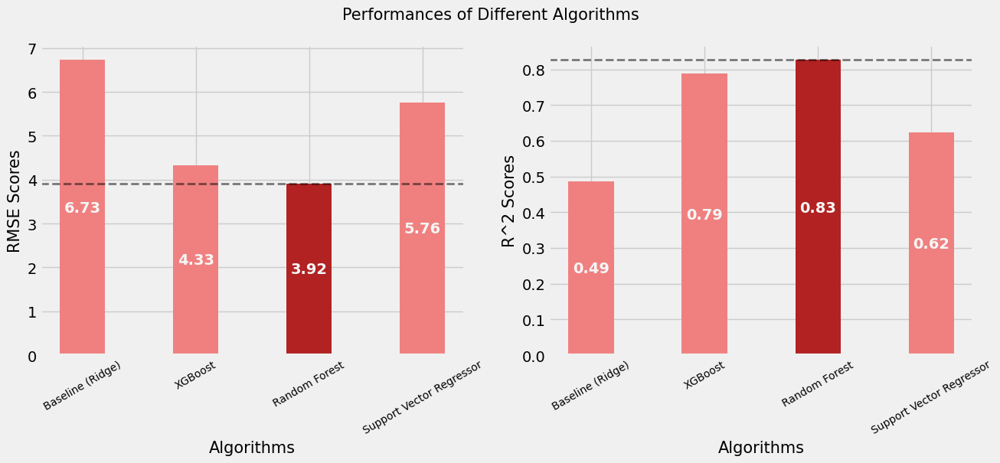

In [56]:
#plot results on test set
fig, ax = plt.subplots(1,2,figsize=(14,5))

ind = np.arange(len(r2_scores)) + 0.3
width = 0.4

for i,score_dict in enumerate([rmse_scores, r2_scores]): 
    scores = list(score_dict.values())

    bars = ax[i].bar(ind, scores, width, color="lightcoral")
    ax[i].bar_label(bars, fmt='%.2f', weight='bold', label_type='center', color='whitesmoke')
    ax[i].patches[scores.index(min(scores)) if i==0 else scores.index(max(scores))].set_facecolor('firebrick') # Highlight the best resulted bar
    ax[i].axhline(min(scores) if i==0 else max(scores), ls="--", alpha=0.5, color="black", lw=2) # Draw a dashed line of the best algorithm
    ax[i].set_xticks(ind, labels=score_dict.keys(), fontsize=10, rotation=30)
    ax[i].set_xlabel("Algorithms", fontsize=15)
    ax[i].set_ylabel("RMSE Scores" if i==0 else "R^2 Scores", fontsize=15)

fig.suptitle("Performances of Different Algorithms", fontsize=15)
plt.show()

Random Forest performed best on test sets in terms of both R^2 score and RSME
- XGBoost performed close to Random Forest Support Vector Regressor performed poorly on the test dataset
- All tuned algorithms achieved to outperform the baseline result

### Residual Analysis

In [57]:
model = algorithms["Random Forest"]
model.fit(X_train, y_train)
y_pred = model.predict(X_test)
residuals = [t-p for p,t in zip(y_pred, y_test)]

Plot residual plots

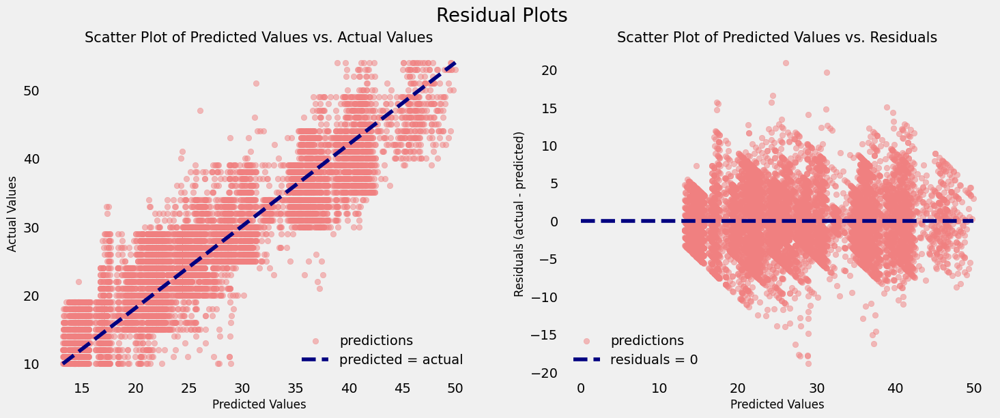

In [65]:
#Residual plots

from mpl_toolkits.axes_grid1.inset_locator import inset_axes

fig, ax = plt.subplots(1,2,figsize=(16,6))

ax[0].scatter(x=y_pred, y=y_test, alpha=0.5, color="lightcoral", label="predictions")
ax[0].plot([min(y_pred), max(y_pred)], [min(y_test), max(y_test)], ls="dashed", color="navy", label="predicted = actual")
ax[0].legend(loc="lower right", frameon=False)

ax[0].set_xlabel("Predicted Values", fontsize=12)
ax[0].set_ylabel("Actual Values", fontsize=12)
ax[0].set_title("Scatter Plot of Predicted Values vs. Actual Values", fontsize=15)
ax[0].grid(visible=False)


ax[1].scatter(x=y_pred, y=residuals, alpha=0.5, color="lightcoral", label="predictions")
ax[1].plot([0, max(y_pred)], [0,0], ls="dashed", color="navy", label="residuals = 0")
ax[1].legend(loc="lower left", frameon=False)

ax[1].set_xlabel("Predicted Values", fontsize=12)
ax[1].set_ylabel("Residuals (actual - predicted)", fontsize=12)
ax[1].set_title("Scatter Plot of Predicted Values vs. Residuals", fontsize=15)
ax[1].grid(visible=False)

fig.suptitle("Residual Plots", fontsize=20)
plt.show()

Plot residual distributions

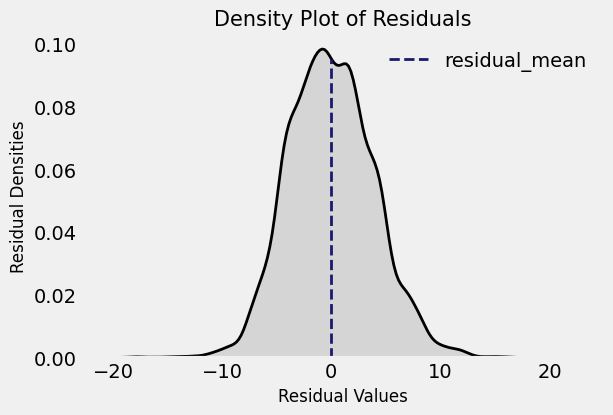

In [59]:
fig, ax = plt.subplots(figsize=(6,4))

ax = sns.kdeplot(residuals, shade=False, color="black", linewidth=2)

kdeline = ax.lines[0]
xs = kdeline.get_xdata()
ys = kdeline.get_ydata()

height = np.interp(np.mean(residuals), xs, ys)
ax.vlines(np.mean(residuals), 0, height, color='midnightblue', ls='dashed', lw=2, label="residual_mean")

ax.fill_between(xs, 0, ys, facecolor='dimgrey', alpha=0.2)

ax.legend(loc="best", frameon=False)

ax.set_xlabel("Residual Values", fontsize=12)
ax.set_ylabel("Residual Densities", fontsize=12)
ax.set_title("Density Plot of Residuals", fontsize=15)
ax.grid(visible=False)
plt.show()

### Feature Importances

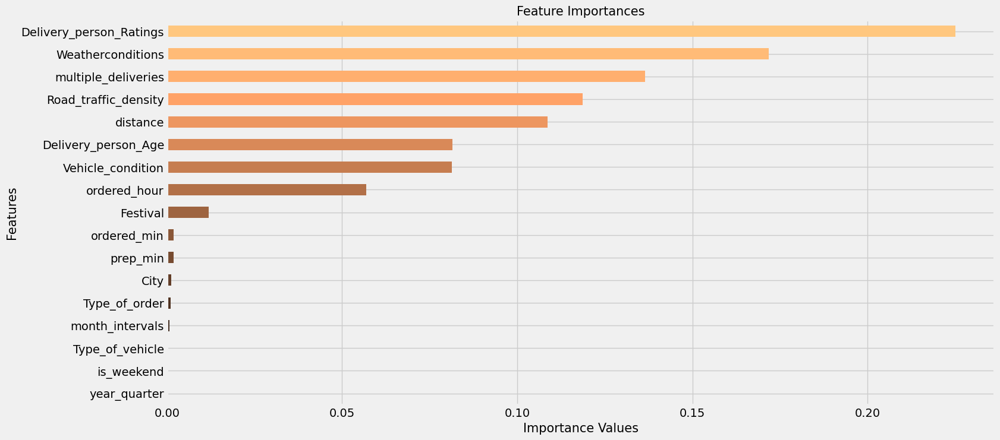

In [60]:
from mycolorpy import colorlist as mcp

imp = list(model.feature_importances_)

importances = pd.DataFrame({"feature": X_train.columns, "importance": imp})
importances = importances.sort_values(by="importance")

colors = mcp.gen_color(cmap='copper', n=len(importances))

ax = importances.plot(kind='barh', x='feature', y='importance', figsize=(16,8), color=colors, legend=False)
#ax.axvline(0.05, ls="--", color="firebrick")
plt.xlabel("Importance Values", fontsize=15)
plt.ylabel("Features", fontsize=15)
plt.title("Feature Importances", fontsize=15)
plt.show()

Let's investigate the relevant and irrelevant features

In [61]:
#Sort feature importances by descending order

importances = importances.sort_values(by="importance", ascending=False)
importances.reset_index(inplace=True, drop=True)
importances.head(3)

,feature,importance
0,Delivery_person_Ratings,0.225043
1,Weatherconditions,0.171736
2,multiple_deliveries,0.136436


Investigate which features are enough to build the best algorithm 

In [62]:
r2_scores_new = []
for feature_num in range(len(importances)):
    
    new_features = importances["feature"][:feature_num+1]

    X_train_new = X_train[new_features]
    X_test_new = X_test[new_features]

    model.fit(X_train_new, y_train)
    pred = model.predict(X_test_new).reshape(-1,1)

    r2_scores_new.append(r2_score(pred, y_test))

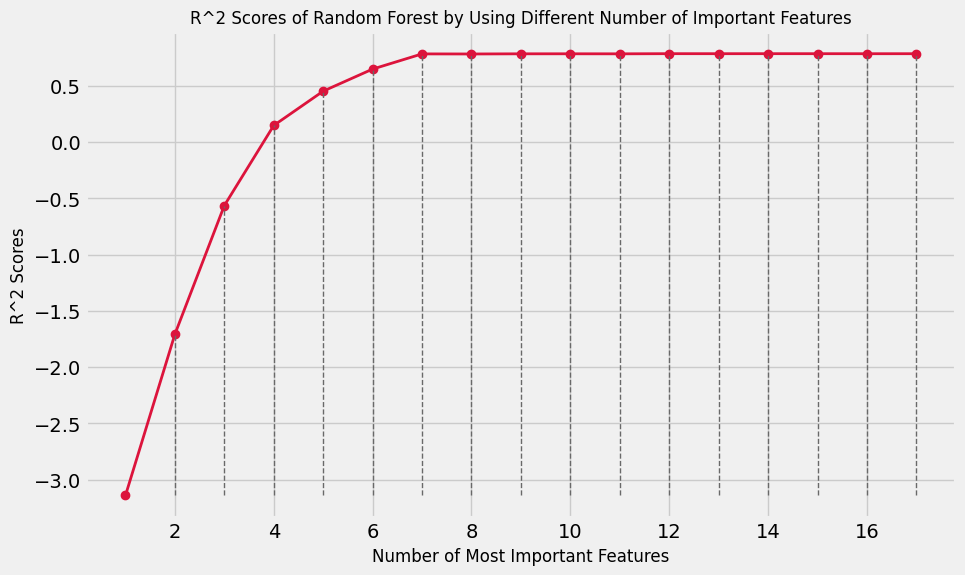

In [68]:
plt.figure(figsize=(10,6))

plt.plot(range(1,len(importances)+1), r2_scores_new, marker="o", lw=2, color="crimson")

plt.vlines(range(1,len(importances)+1), min(r2_scores_new), r2_scores_new, color='dimgray', ls='dashed', lw=1)

plt.xlabel("Number of Most Important Features", fontsize=12)
plt.ylabel("R^2 Scores", fontsize=12)
plt.title("R^2 Scores of Random Forest by Using Different Number of Important Features", fontsize=12)

plt.show()

It seems the most important 7 features are necessary for model to predict the delivery times. Other features are irrelevant for the model since adding them to the model does not yield significantly better results

In [67]:
#Most important features
importances[:7]

,feature,importance
0,Delivery_person_Ratings,0.225043
1,Weatherconditions,0.171736
2,multiple_deliveries,0.136436
3,Road_traffic_density,0.118713
4,distance,0.108665
5,Delivery_person_Age,0.081567
6,Vehicle_condition,0.081342
